# Hybrid Demucs from Colab

This supports the Demucs source separation model (https://github.com/facebookresearch/demucs/)
This is only for separation with pre-trained models, not training!

You can either upload files manually (slow) or link your Google Drive account.

논문: https://arxiv.org/pdf/1911.13254.pdf

arxiv: https://arxiv.org/abs/1911.13254


wav source file: https://www.ee.columbia.edu/~dpwe/sounds/music/

In [1]:
# Customize the following options!
model = "mdx_extra"
extensions = ["mp3", "wav", "ogg", "flac"]  # we will look for all those file types.
two_stems = None   # only separate one stems from the rest, for instance
# two_stems = "vocals"

# Options for the output audio.
mp3 = False
mp3_rate = 320
float32 = True  # output as float 32 wavs, unsused if 'mp3' is True.
int24 = False    # output as int24 wavs, unused if 'mp3' is True.
# You cannot set both `float32 = True` and `int24 = True` !!

in_path = 'input'
out_path = 'output'

In [2]:
import os


if not os.path.exists(in_path):
    os.mkdir(in_path)
    
if not os.path.exists(out_path):
    os.mkdir(out_path)

In [3]:
#@title Useful functions, don't forget to execute
import io
from pathlib import Path
import select
import subprocess as sp
import sys
from typing import Dict, Tuple, Optional, IO


def find_files(in_path):
    out = []
    for file in Path(in_path).iterdir():
        if file.suffix.lower().lstrip(".") in extensions:
            out.append(file)
    return out

def copy_process_streams(process: sp.Popen):
    def raw(stream: Optional[IO[bytes]]) -> IO[bytes]:
        assert stream is not None
        if isinstance(stream, io.BufferedIOBase):
            stream = stream.raw
        return stream

    p_stdout, p_stderr = raw(process.stdout), raw(process.stderr)
    stream_by_fd: Dict[int, Tuple[IO[bytes], io.StringIO, IO[str]]] = {
        p_stdout.fileno(): (p_stdout, sys.stdout),
        p_stderr.fileno(): (p_stderr, sys.stderr),
    }
    fds = list(stream_by_fd.keys())

    while fds:
        # `select` syscall will wait until one of the file descriptors has content.
        ready, _, _ = select.select(fds, [], [])
        for fd in ready:
            p_stream, std = stream_by_fd[fd]
            raw_buf = p_stream.read(2 ** 16)
            if not raw_buf:
                fds.remove(fd)
                continue
            buf = raw_buf.decode()
            std.write(buf)
            std.flush()

def separate(inp=None, outp=None):
    inp = Path(inp) if inp else Path(in_path)
    outp = Path(outp) if outp else Path(out_path)
    outp.mkdir(parents=True, exist_ok=True)
    cmd = ["python3", "-m", "demucs.separate", "-o", str(outp), "-n", model]
    if mp3:
        cmd += ["--mp3", f"--mp3-bitrate={mp3_rate}"]
    if float32:
        cmd += ["--float32"]
    if int24:
        cmd += ["--int24"]
    if two_stems is not None:
        cmd += [f"--two-stems={two_stems}"]
    files = [str(f) for f in find_files(inp)]
    if not files:
        print(f"No valid audio files in {in_path}")
        return
    print("Going to separate the files:")
    print('\n'.join(files))
    print("With command: ", " ".join(cmd))
    p = sp.Popen(cmd + files, stdout=sp.PIPE, stderr=sp.PIPE)
    copy_process_streams(p)
    p.wait()
    if p.returncode != 0:
        print("Command failed, something went wrong.")

In [4]:
# This can be quite slow, in particular the loading, and saving from GDrive. Please be patient!
# This is from google drive! Also, this will separate all the files inside the MyDrive/demucs folder,
# so when you are happy with the results, remove the songs from there.
if not os.path.exists(f"{out_path}/{model}"):
    separate()

# check wav spectrogram (bass stem)

## 파일 읽어오기

In [5]:
import librosa


file_name = ""
for root, dirs, files in os.walk(in_path):
    for file in files:
        if any(file.endswith(ext) for ext in extensions):
            file_name = file
            break
    if file_name:
        break

if mp3:
    audio_format = "mp3"
else:
    audio_format = "wav"
instrument = "bass"

song_name, _ = os.path.splitext(file_name)

y, sr = librosa.load(f"{out_path}/{model}/{song_name}/{instrument}.{audio_format}")

## 스펙트로그램

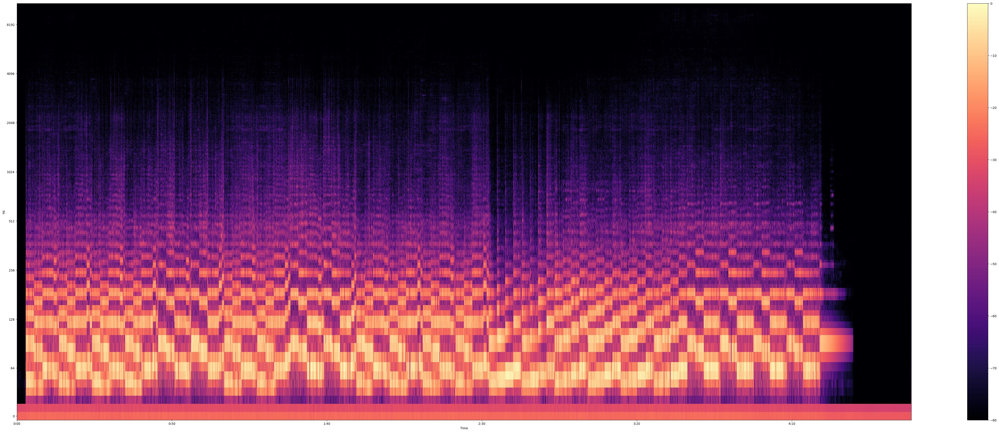

In [6]:
import librosa.display
import numpy as np
import matplotlib.pyplot as plt


D = np.abs(librosa.stft(y, n_fft=2048, hop_length=512))
DB = librosa.amplitude_to_db(D, ref=np.max)

plt.figure(figsize=(64, 24))
librosa.display.specshow(DB, sr=sr, hop_length=512, x_axis='time', y_axis='log')
plt.colorbar()
plt.show()

## EQ Curve

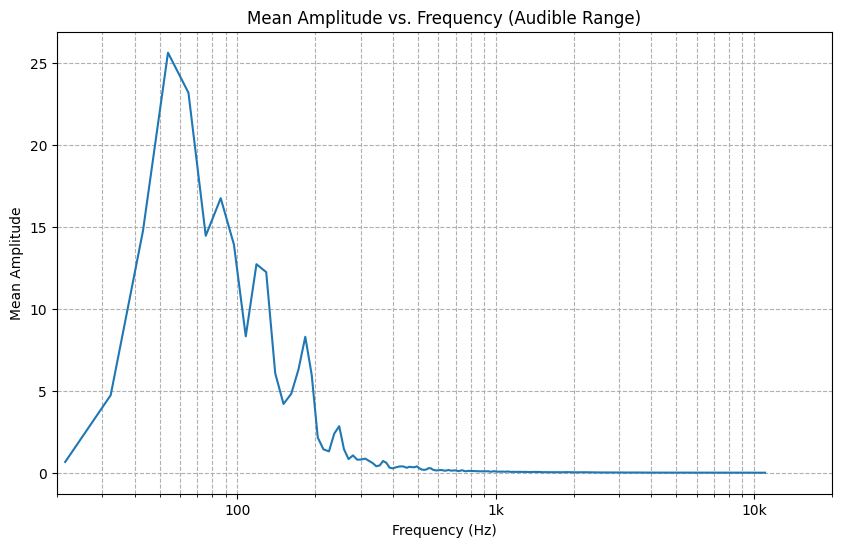

In [7]:
import matplotlib.ticker as ticker


mean_amplitude = np.mean(D, axis=1)

frequencies = librosa.fft_frequencies(sr=sr, n_fft=2048)

audible_indices = np.where((frequencies >= 20) & (frequencies <= 20000))
audible_frequencies = frequencies[audible_indices]
audible_mean_amplitude = mean_amplitude[audible_indices]

def freq_formatter(x, pos):
    if x >= 1000:
        return f'{int(x/1000)}k'
    else:
        return f'{int(x)}'

plt.figure(figsize=(10, 6))
plt.plot(audible_frequencies, audible_mean_amplitude)
plt.xscale('log')  # 주파수 축을 로그 스케일로 설정
plt.xlabel('Frequency (Hz)')
plt.ylabel('Mean Amplitude')
plt.title('Mean Amplitude vs. Frequency (Audible Range)')
plt.grid(True, which="both", ls="--")  # 그리드 추가
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(freq_formatter))
plt.xlim(20, 20000)  # x축 범위를 가청 주파수 범위로 설정
plt.show()

## Mel 스펙트로그램

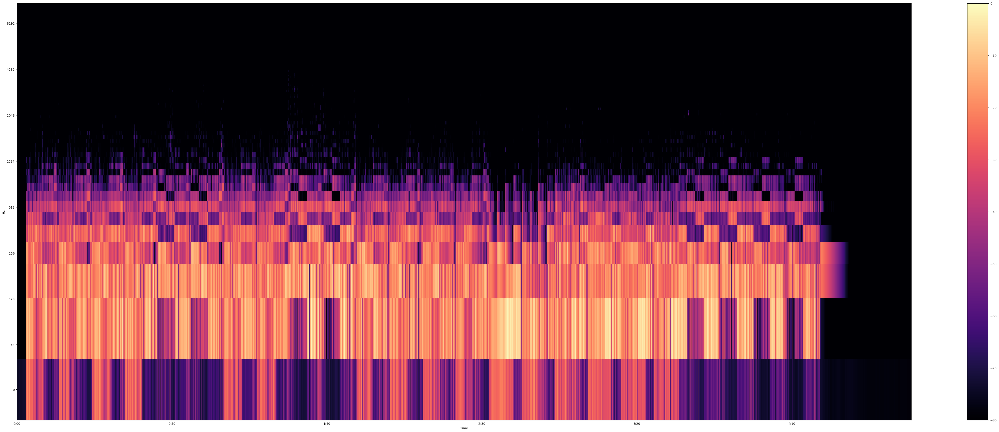

In [8]:
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

plt.figure(figsize=(64, 24))
librosa.display.specshow(S_DB, sr=sr, hop_length=512, x_axis='time', y_axis='log')
plt.colorbar()
plt.show()

## 크로마 분석

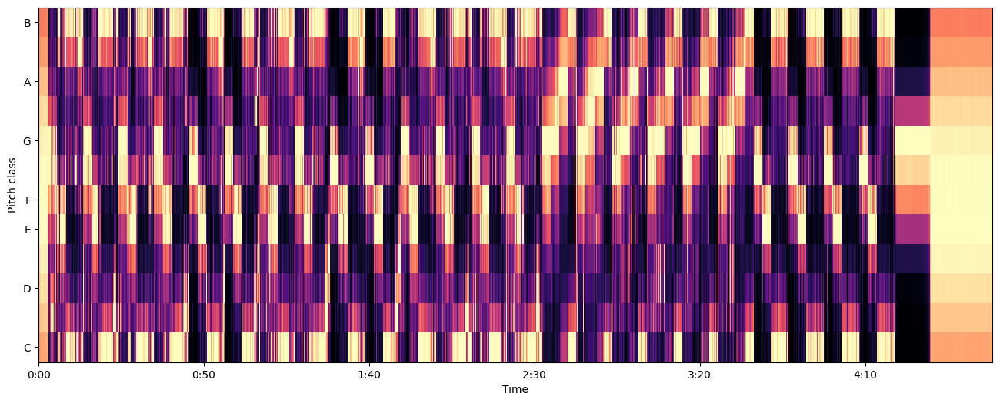

In [9]:
chromagram = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=512)

plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=512)
plt.show()

# check wav spectrogram (vocal stem)

## 스펙트로그램

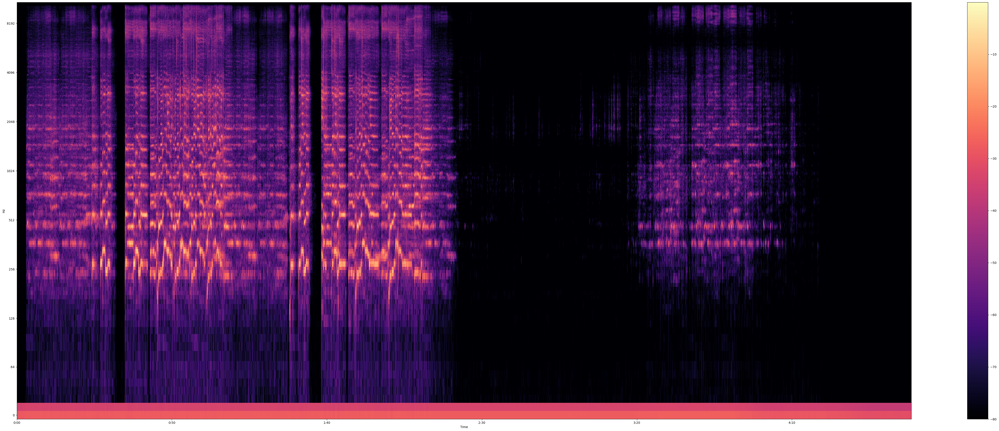

In [10]:
instrument = "vocals"

y, sr = librosa.load(f"{out_path}/{model}/{song_name}/{instrument}.{audio_format}")
D = np.abs(librosa.stft(y, n_fft=2048, hop_length=512))
DB = librosa.amplitude_to_db(D, ref=np.max)

plt.figure(figsize=(64, 24))
librosa.display.specshow(DB, sr=sr, hop_length=512, x_axis='time', y_axis='log')
plt.colorbar()
plt.show()

## EQ Curve

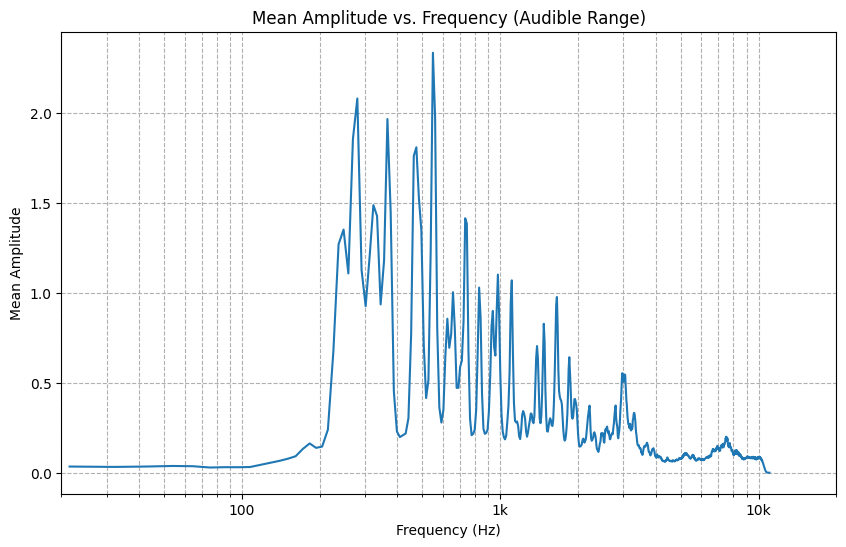

In [11]:
mean_amplitude = np.mean(D, axis=1)

frequencies = librosa.fft_frequencies(sr=sr, n_fft=2048)

audible_indices = np.where((frequencies >= 20) & (frequencies <= 20000))
audible_frequencies = frequencies[audible_indices]
audible_mean_amplitude = mean_amplitude[audible_indices]

def freq_formatter(x, pos):
    if x >= 1000:
        return f'{int(x/1000)}k'
    else:
        return f'{int(x)}'

plt.figure(figsize=(10, 6))
plt.plot(audible_frequencies, audible_mean_amplitude)
plt.xscale('log')  # 주파수 축을 로그 스케일로 설정
plt.xlabel('Frequency (Hz)')
plt.ylabel('Mean Amplitude')
plt.title('Mean Amplitude vs. Frequency (Audible Range)')
plt.grid(True, which="both", ls="--")  # 그리드 추가
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(freq_formatter))
plt.xlim(20, 20000)  # x축 범위를 가청 주파수 범위로 설정
plt.show()

## 멜 스펙트로그램

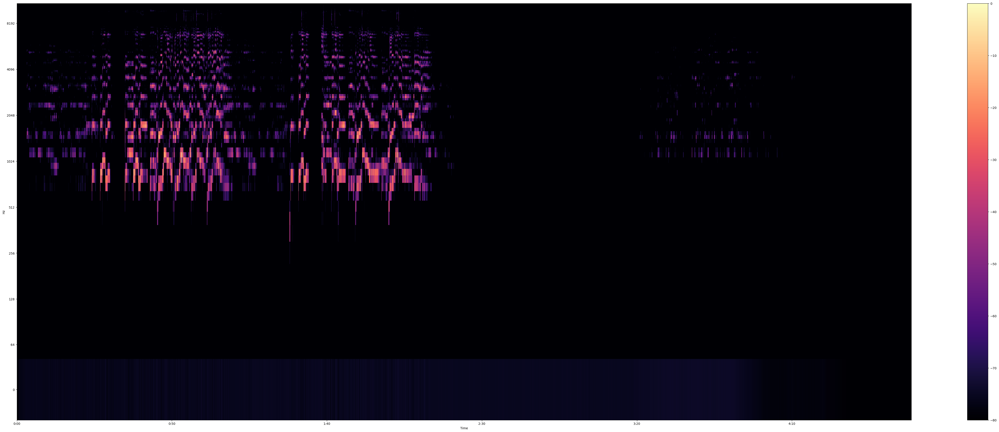

In [12]:
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

plt.figure(figsize=(64, 24))
librosa.display.specshow(S_DB, sr=sr, hop_length=512, x_axis='time', y_axis='log')
plt.colorbar()
plt.show()

## 크로마 분석

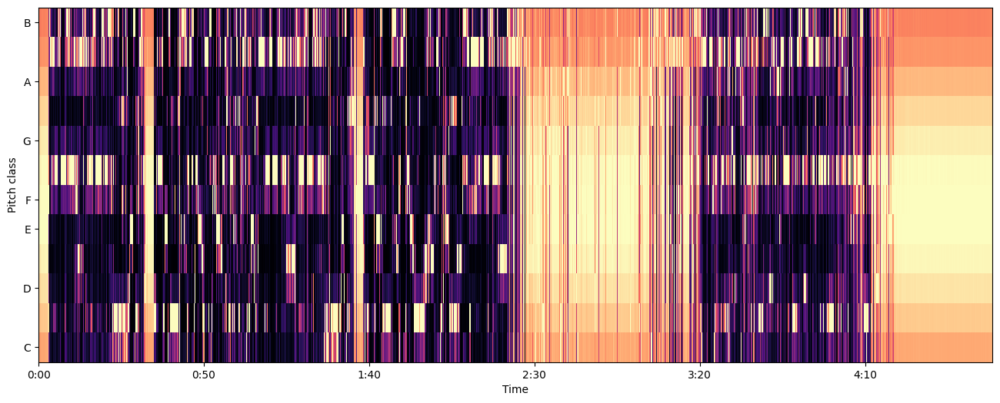

In [13]:
chromagram = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=512)

plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=512)
plt.show()

# bass, vocal midi convert (test)

## Fundamental Frequency 추출

In [14]:
bass, sr = librosa.load(f"{out_path}/{model}/{song_name}/bass.wav")
vocals, sr = librosa.load(f"{out_path}/{model}/{song_name}/vocals.wav")

In [15]:
def fundamental_frequencies(instrument, sr):
    D = np.abs(librosa.stft(instrument))
    frequencies = librosa.fft_frequencies(sr=sr)
    max_magnitude_index = np.argmax(D, axis=0)
    result = frequencies[max_magnitude_index]
    return result

def freq_to_midi(frequencies):
    midi_notes = []
    for i, frequency in enumerate(frequencies):
        if frequency > 0:
            midi_notes.append(69 + 12 * np.log2(frequency / 440.0))
        else:
            midi_notes.append(None)
    return midi_notes

def get_midi(instrument, sr):
    return freq_to_midi(fundamental_frequencies(instrument, sr))

In [16]:
from mido import MidiFile, MidiTrack, Message

def save_midi(notes, filename='output.mid', tempo=500000):
    mid = MidiFile()
    track = MidiTrack()
    mid.tracks.append(track)

    track.append(Message('program_change', program=12, time=0))  # 프로그램 변경 메시지 (예: 음색 변경)
    
    for note in notes:
        if note is not None:
            # 노트 온 (note on)
            track.append(Message('note_on', note=int(note), velocity=64, time=0))
            # 노트 오프 (note off)
            track.append(Message('note_off', note=int(note), velocity=127, time=tempo))
        else:
            # 노트가 None인 경우, 일시적으로 다음 노트까지 기다립니다 (노트 길이를 조정할 수 있음)
            track.append(Message('note_off', note=0, velocity=0, time=tempo))
    
    mid.save(filename)

bass_midi = get_midi(bass, sr)
if not os.path.exists("midi_files"):
    os.mkdir("midi_files")
save_midi(bass_midi, 'midi_files/bass_midi.mid')

In [22]:
pattern = MidiFile('midi_files/bass_midi.mid')
for i, track in enumerate(pattern.tracks):
    print(f'Track {i}: {track.name}')
    for msg in track:
        print(msg)

Track 0: 
program_change channel=0 program=12 time=0
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel=0 note=0 velocity=0 time=500000
note_off channel